In [1]:
import numpy as np
import pandas as pd
import open3d as o3d
import os
from tools import load, project, image, signal, camera, adjustment
# auto reload packages
%load_ext autoreload
%autoreload 2

/tmp/ipykernel_1888205/2576197155.py:2: DeprecationWarning: 
Pyarrow will become a required dependency of pandas in the next major release of pandas (pandas 3.0),
(to allow more performant data types, such as the Arrow string type, and better interoperability with other libraries)
but was not found to be installed on your system.
If this would cause problems for you,
please provide us feedback at https://github.com/pandas-dev/pandas/issues/54466
        
  import pandas as pd


Jupyter environment detected. Enabling Open3D WebVisualizer.
[Open3D INFO] WebRTC GUI backend enabled.
[Open3D INFO] WebRTCWindowSystem: HTTP handshake server disabled.


# Azimuth estimation
## Load data

In [2]:
terrain_data = "./data/MNS/"
cam_data = "./data/pyronear_cam_data/"
horizon_data = "./data/horizon/"

In [3]:
# cameras metadata
devices = pd.read_csv(cam_data+'API_DATA - devices.csv')
print(devices.columns.to_list())
device_id = 5
device = devices[devices.id==device_id].squeeze()

['id', 'login', 'password', 'azimuth', 'pitch', 'lat', 'lon', 'elevation', 'specs', 'last_ping', 'angle_of_view', 'software_hash', 'owner_id', 'scope', 'group_id', 'site_id', 'api_id']


In [4]:
# load elevation data
lat, lon, altitude = device[['lat', 'lon', 'elevation']]
view_point = project.to_xy(lat, lon, altitude)
place_name = device['login'].split('_')[0]
if not os.path.exists(terrain_data+place_name+'.xyz'):
    load.download_from_eio(terrain_data, place_name, lat, lon)
pc = o3d.io.read_point_cloud(terrain_data+place_name+'.xyz')

In [5]:
o3d.visualization.draw_geometries([pc])

# Extract skyline
Based on [A New Method of Improving the Azimuth in Mountainous Terrain by Skyline Matching](https://link.springer.com/article/10.1007/s41064-020-00093-1) by Nagy Balázs (2019)

In [6]:
spherical = project.array_cartesian_to_spherical(pc.points, view_point)
angles = project.get_deg_angles(spherical)

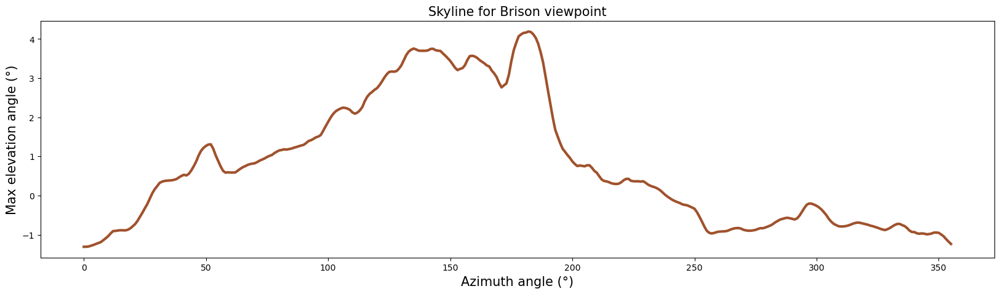

In [7]:
skyline = project.get_skyline(angles)
n=5
smooth_skyline = np.convolve(skyline, np.ones(n)/n, mode='valid')
signal.plot_skyline(smooth_skyline, 'Skyline for Brison viewpoint')

## Compare with image skyline

In [8]:
horizon_detector = image.HorizonDetector()
horizon_detector.load_image(cam_data+device['login']+'/'+'pyronear_brison_1_2023_06_24T04_28_17.jpg')
horizon_detector.estimate_depth()
horizon_detector.extract_horizon()
horizon_detector.save_horizon(horizon_data, device['login'])

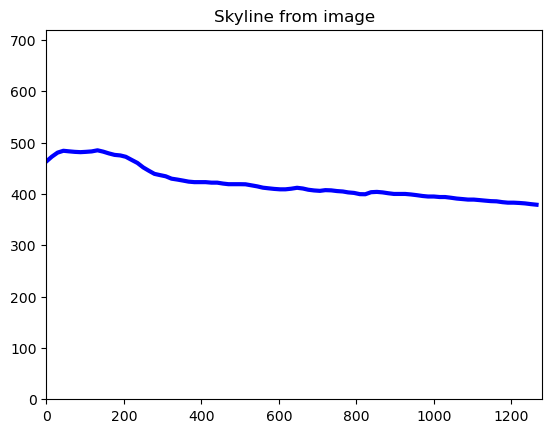

In [9]:
width, height = horizon_detector.img.size
image_skyline = load.load_skyline(horizon_data+device['login']+'.npy', device['angle_of_view'], width, height, plot=True)

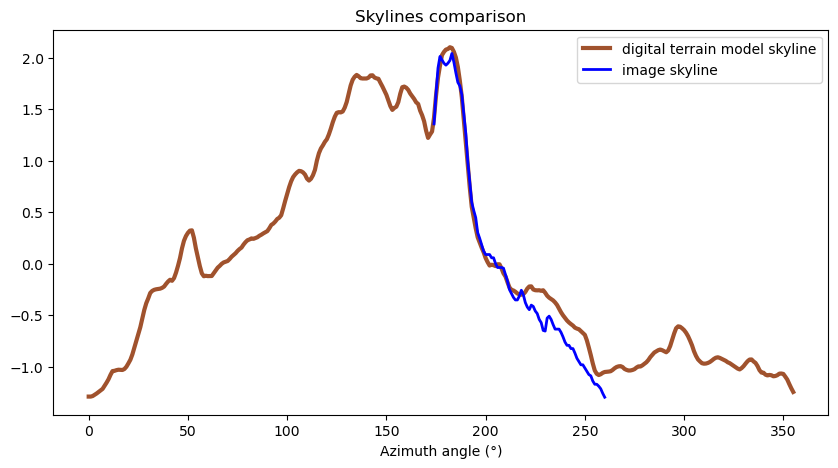

<Figure size 640x480 with 0 Axes>

In [10]:
fig = signal.plot_skylines_comparison(signal.normalize(smooth_skyline), signal.normalize(image_skyline))

In [11]:
# compute sliding square difference between reference signal (panoramic skyline) and shifted/noisy signal (skyline from image)
azimuth = signal.skylines_to_azimuth(smooth_skyline, image_skyline)
azimuth

217.5

In [12]:
# example file of parameters
parameters = o3d.io.read_pinhole_camera_parameters("ScreenCamera_viewpoint.json")
# extrinsic matrix is computed for given azimuth and viewpoint
parameters.extrinsic = camera.get_extrinsic(azimuth, view_point)
camera.visualize([pc], parameters)

## Display estimation

In [14]:
def pc_to_mesh(pc):
    pc.estimate_normals()
    mesh, densities = o3d.geometry.TriangleMesh.create_from_point_cloud_poisson(pc, depth=9)
    vertices_to_remove = densities < np.quantile(densities, 0.05)
    mesh.remove_vertices_by_mask(vertices_to_remove)
    return mesh
mesh = pc_to_mesh(pc)

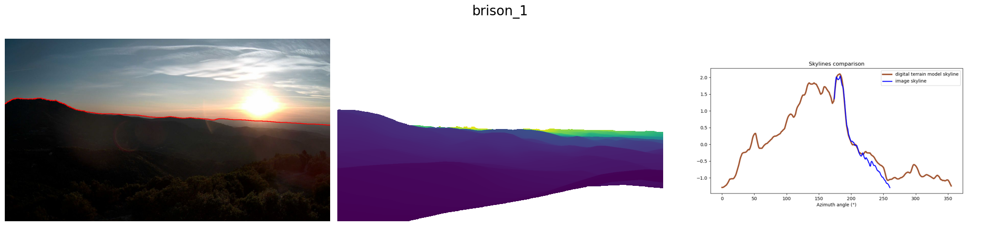

In [15]:
depths = camera.get_depths(mesh, parameters)
image.compare([horizon_detector.get_image_with_skyline(), image.depths_no_sky(depths), fig], device['login'])

In [16]:
# load trained adjustment model
modelpath='./data/models/trained_signal_adjustment.pth'
model = adjustment.AdjustmentModel(load_from=modelpath)

def predict_signal(ref_signal, sub_signal):
    '''Adjust a sub signal from a reference signal
    Args:
        ref_signal (np.array): reference signal
        sub_signal (np.array): sub signal
    Returns:
        np.array: adjusted signal
    '''
    # extract features
    features = adjustment.SignalLoader.get_features_from_pair(ref_signal, sub_signal)
    # predict adjustments
    prediction = model(features)
    # adjust
    adjusted_signal = adjustment.SignalLoader.adjust_signal(prediction, sub_signal)
    return adjusted_signal

## Repeat for different images

In [20]:
interesting_images = {
    'brison_1': 'pyronear_brison_1_2023_06_24T04_28_17.jpg',
    'brison_3': 'pyronear_brison_3_2023_10_07T14_06_09.jpg',
    'brison_4': 'pyronear_brison_4_2023_09_30T07_37_00.jpg',
    'cabanelle_1': 'pyronear_cabanelle_1_2023_10_16T06_21_01.jpg',
    'cabanelle_3': 'pyronear_cabanelle_3_2023_09_28T17_34_06.jpg',
    'cabanelle_4': 'pyronear_cabanelle_4_2023_09_28T16_00_36.jpg',
    'courmettes_1': 'pyronear_courmettes_1_2023_11_07T12_49_43.jpg',
    'courmettes_2': 'pyronear_courmettes_2_2023_09_25T16_00_00.jpg',
    'courmettes_3': 'pyronear_courmettes_3_2023_11_05T09_02_36.jpg',
    'courmettes_4': 'pyronear_courmettes_4_2023_11_06T10_14_51.jpg',
    'ferion_1': 'pyronear_ferion_1_2023_11_07T15_41_46.jpg',
    'ferion_2': 'pyronear_ferion_2_2023_10_28T12_38_30.jpg',
    'ferion_3': 'pyronear_ferion_3_2023_10_27T13_34_44.jpg',
    'ferion_4': 'pyronear_ferion_4_2023_11_07T10_30_47.jpg',
    'ferion_4': 'pyronear_ferion_4_2023_11_07T10_30_47.jpg',
    'marguerite_1': 'pyronear_marguerite_1_2023_07_28T06_22_32.jpg',
    'marguerite_2': 'pyronear_marguerite_2_2023_09_11T07_32_22.jpg',
    #'marguerite_3': 'pyronear_marguerite_3_2023_08_18T17_52_03.jpg',
    #'marguerite_4': 'pyronear_marguerite_4_2023_09_09T10_37_39.jpg',
    'st_peray_1': 'pyronear_st_peray_1_2023_06_27T09_16_05.jpg',
    'st_peray_2': 'pyronear_st_peray_2_2023_08_22T12_00_38.jpg',
    #'valbonne_1': 'pyronear_valbonne_1_2023_10_31T12_13_27.jpg',
    'valbonne_2': 'pyronear_valbonne_2_2023_10_28T15_39_27.jpg',
    'valbonne_3': 'pyronear_valbonne_3_2023_10_07T12_01_08.jpg',
    #'valbonne_4': 'pyronear_valbonne_4_2023_10_28T16_34_36.jpg',
}

In [18]:
places = set(['_'.join(k.split('_')[:-1]) for k in interesting_images.keys()])
meshes = {p:None for p in places}
places

{'brison',
 'cabanelle',
 'courmettes',
 'ferion',
 'marguerite',
 'st_peray',
 'valbonne'}

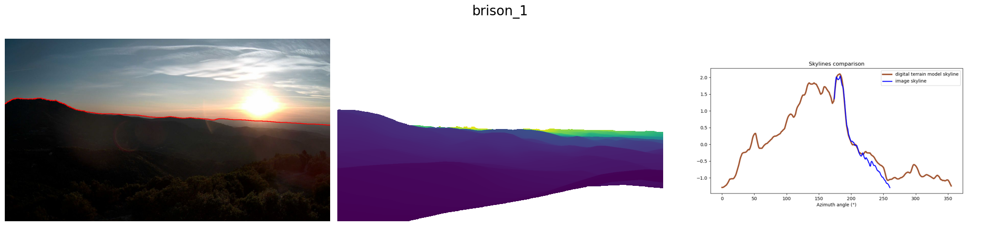

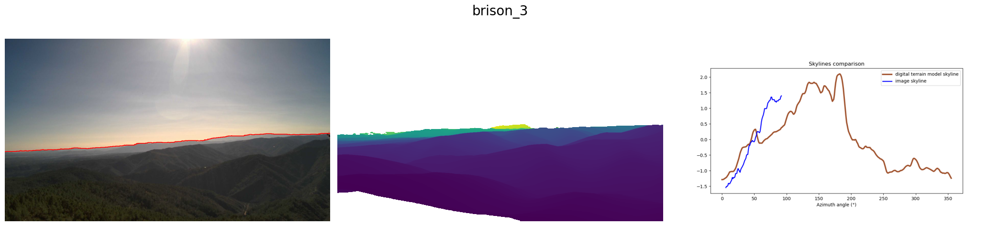

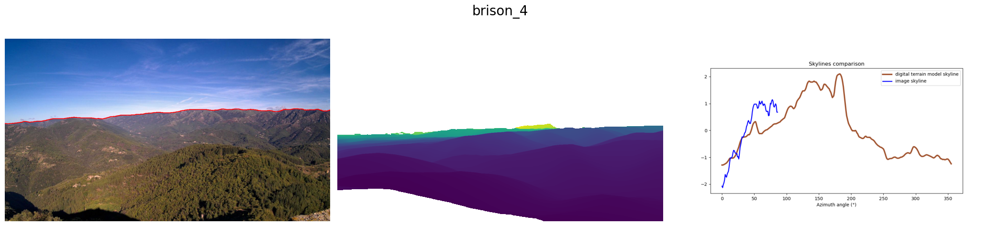

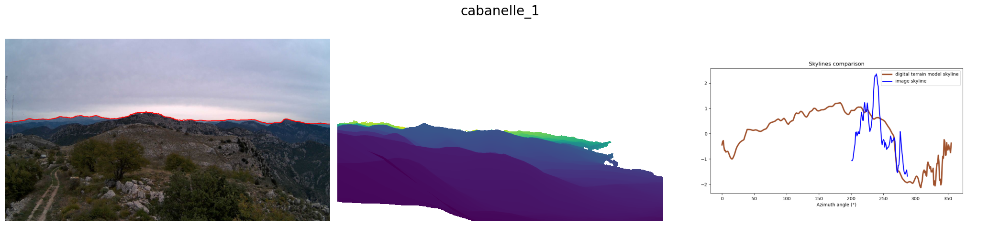

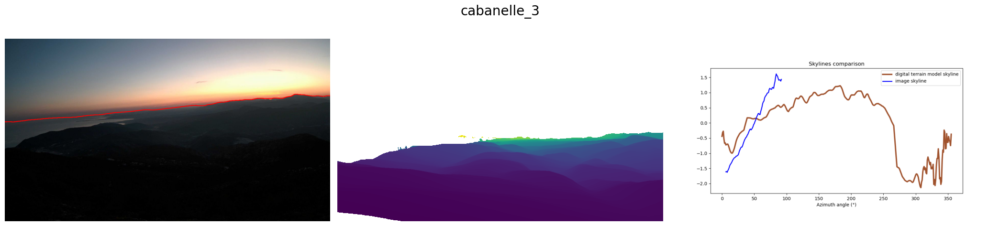

...

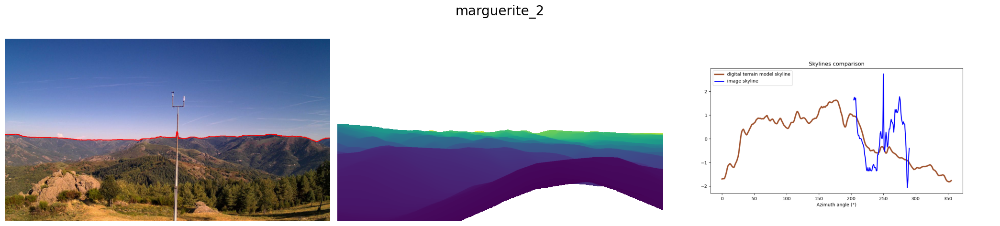

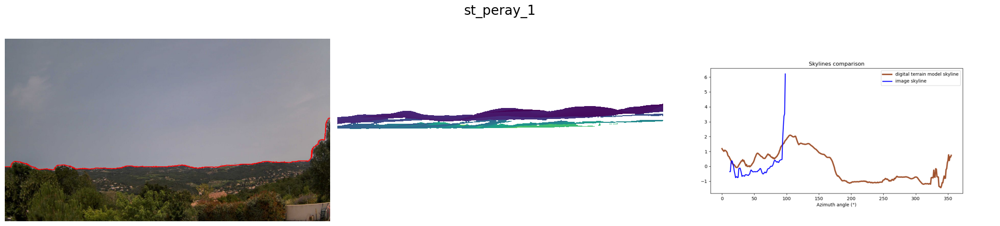

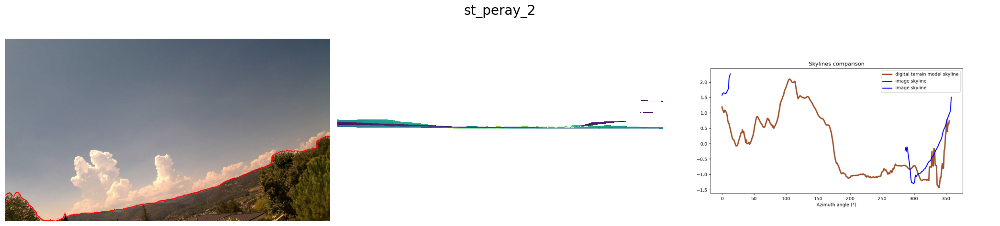

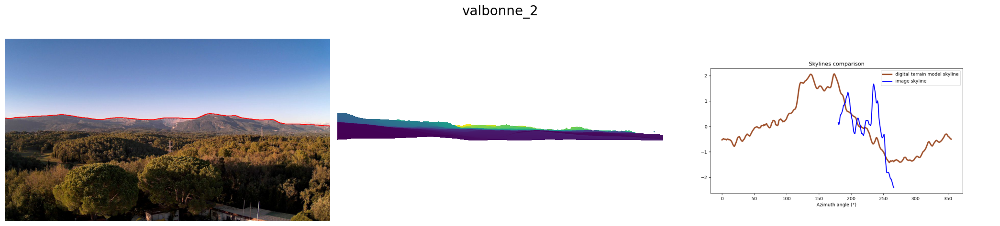

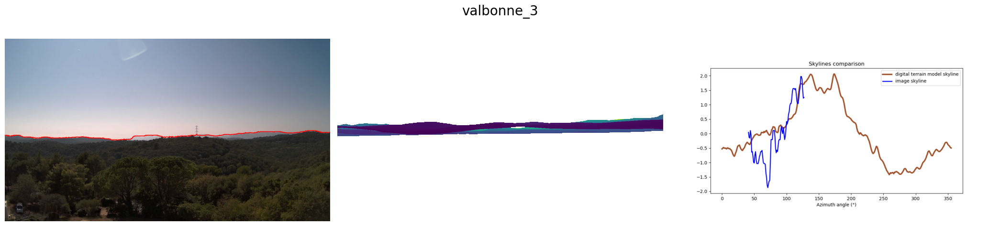

In [21]:
import os
n=5
horizon_detector = image.HorizonDetector()

for camera_name, img_name in interesting_images.items():
    device = devices[devices['login']==camera_name].squeeze()
    place_name = '_'.join(camera_name.split('_')[:-1])
    lat, lon, altitude = device[['lat', 'lon', 'elevation']]
    view_point = project.to_xy(lat, lon, altitude)
    if not os.path.exists(terrain_data+place_name+'.xyz'):
        load.download_from_eio(terrain_data, place_name, lat, lon)
        pc = o3d.io.read_point_cloud(terrain_data+place_name+'.xyz')
        # extract skyline
        spherical = project.array_cartesian_to_spherical(pc.points, view_point)
        angles = project.get_deg_angles(spherical)
        skyline = project.get_skyline(angles, savepath=horizon_data+place_name)
    else:
        pc = o3d.io.read_point_cloud(terrain_data+place_name+'.xyz')
        skyline = np.load(horizon_data+place_name+'.npy').astype(float)
    # compute mesh if not yet defined for this place
    if not meshes[place_name]: 
        meshes[place_name] = pc_to_mesh(pc)
    smooth_skyline = np.convolve(skyline, np.ones(n)/n, mode='valid')
    # extract image horizon
    horizon_detector.load_image(cam_data+camera_name+'/'+img_name)
    horizon_detector.estimate_depth()
    horizon_detector.extract_horizon()
    horizon_detector.save_horizon(horizon_data, device['login'])
    width, height = horizon_detector.img.size
    image_skyline = load.load_skyline(horizon_data+device['login']+'.npy', device['angle_of_view'], width, height)
    # adjust image skyline
    # (no change for now, the model is not good for skylines from images)
    image_skyline_adjusted = image_skyline #predict_signal(smooth_skyline, image_skyline)
    # estimate azimuth
    azimuth = signal.skylines_to_azimuth(smooth_skyline, image_skyline_adjusted)
    #print(camera_name, device['azimuth'], azimuth)
    # example file of parameters
    parameters = o3d.io.read_pinhole_camera_parameters("ScreenCamera_viewpoint.json")
    # extrinsic matrix is computed for given azimuth and viewpoint
    parameters.extrinsic = camera.get_extrinsic(azimuth, view_point)
    # get depths
    depths = camera.get_depths(meshes[place_name], parameters)
    image.compare([horizon_detector.get_image_with_skyline(), 
                   image.depths_no_sky(depths), 
                   signal.plot_skylines_comparison(signal.normalize(smooth_skyline), signal.normalize(image_skyline_adjusted), plot=False)
                   ], camera_name)
    

Observations:  
Can work if the skyline is sufficiently 'unique' (not flat), and no big obstacle in foreground (tree or pole).  
The adjustment model works only with synthetic data, not with skylines from images (that are more noisy).  
next steps: 
- Train adjustment model with more noise, or with skylines extracted from images. 
- Update skyline extraction from image to be resilient to obstacles.